# Customer segmentation 

In [ ]:
# reading a csv file 'data/processed/clicks_orders_merge_filtered_currency.csv'
clicks_orders_merge_filtered_currency = pd.read_csv('data/processed/clicks_orders_merge_filtered_currency.csv')

<Axes: >

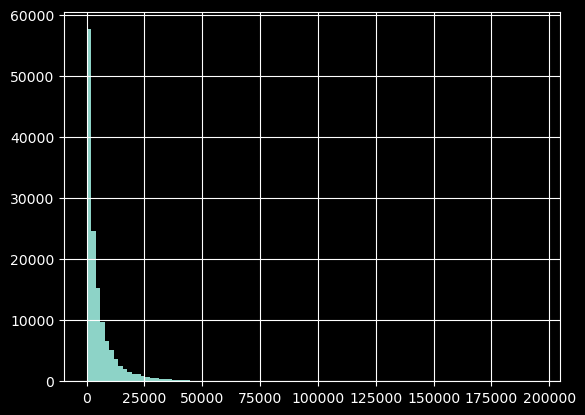

In [ ]:
# calculate total price in SEK
clicks_orders_merge_filtered_currency['orders_total_price_SEK'] = clicks_orders_merge_filtered_currency['clicks_itinerary_sales_price'] * clicks_orders_merge_filtered_currency['exchange_rate']
# clicks_orders_merge_filtered_currency['orders_total_price_SEK'].hist(bins=100)

# histogram of clicks_itinerary_travel_time in hours
clicks_orders_merge_filtered_currency['clicks_itinerary_travel_timehours'] = round(clicks_orders_merge_filtered_currency['clicks_itinerary_travel_time'] / 60,2)
# clicks_orders_merge_filtered_currency['clicks_itinerary_travel_timehours'].hist(bins=100)

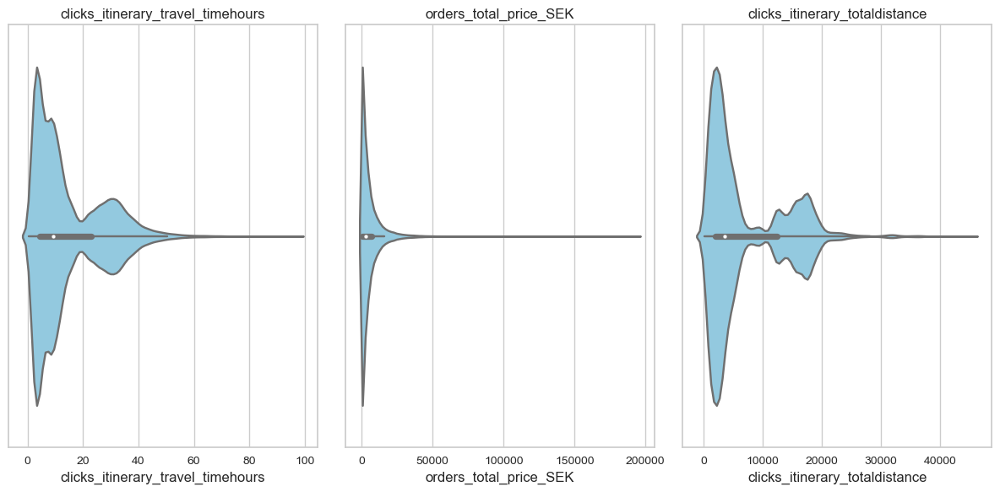

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

vars_to_model = [
    "clicks_itinerary_travel_timehours",
    "orders_total_price_SEK",
    "clicks_itinerary_totaldistance",
]

# create three separate subplots for each variable
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# plot the box plot for each variable
for i, var in enumerate(vars_to_model):
    sns.violinplot(x=var, data=clicks_orders_merge_filtered_currency, ax=axes[i], color="skyblue")
    axes[i].set_title(var)

# adjust the layout and display the plot
plt.tight_layout()
plt.show()

In [ ]:
# create a new dataframe with only the variables in vars_to_model
data_to_model = clicks_orders_merge_filtered_currency[vars_to_model]

# calculate the first and third quartiles for each variable
Q1 = data_to_model.quantile(0.25)
Q3 = data_to_model.quantile(0.75)

# calculate the interquartile range (IQR) for each variable
IQR = Q3 - Q1

# define the upper and lower bounds for outliers
lower_bound = Q1 - 1.5 * IQR
upper_bound = Q3 + 1.5 * IQR

# identify and remove outliers
outliers = ((data_to_model < lower_bound) | (data_to_model > upper_bound)).any(axis=1)
cleaned_data = data_to_model[~outliers]


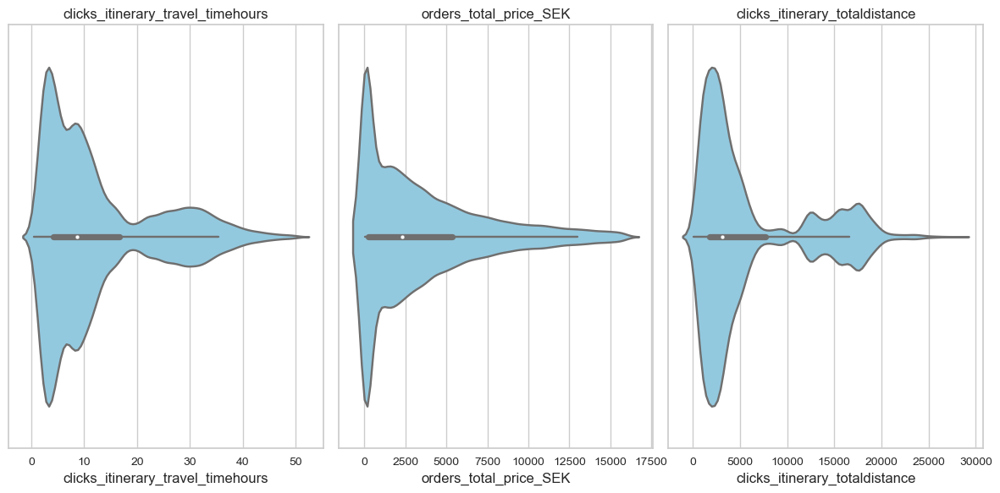

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

# create three separate subplots for each variable
fig, axes = plt.subplots(1, 3, figsize=(12, 6))

# plot the box plot for each variable
for i, var in enumerate(vars_to_model):
    sns.violinplot(x=var, data=cleaned_data, ax=axes[i], color="skyblue")
    axes[i].set_title(var)

# adjust the layout and display the plot
plt.tight_layout()
plt.show()


In [ ]:

# scaling variables to be used in clustering
from sklearn.preprocessing import scale
scaled_flight_kmeans = scale(
    cleaned_data,
    with_mean=True,
    with_std=True,
    )


In [ ]:
# make clustering on flight_kmeans
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=3, random_state=0).fit(scaled_flight_kmeans)


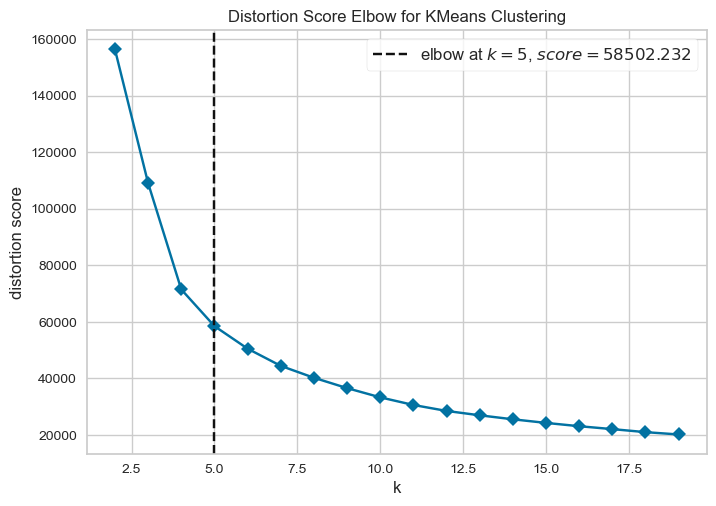

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [ ]:
from sklearn.cluster import KMeans
from yellowbrick.cluster import KElbowVisualizer
import matplotlib.pyplot as plt
import warnings

# suppress all warnings
warnings.filterwarnings("ignore")


visualizer = KElbowVisualizer(kmeans, k=(2, 20), metric='distortion', timings=False, n_init=10)

visualizer.fit(scaled_flight_kmeans)  # scaled_flight_kmeans is the data to cluster
visualizer.show()  # displays the plot


In [ ]:
final_kmeans = KMeans(n_clusters=7, random_state=0).fit(scaled_flight_kmeans)

# visuakzie in 3d in plotly final_kmeans results
import plotly.express as px
import plotly.graph_objects as go

fig = px.scatter_3d(   
    cleaned_data,
    x='clicks_itinerary_travel_timehours',
    y='orders_total_price_SEK',
    z='clicks_itinerary_totaldistance',
    color=final_kmeans.labels_,
    opacity=0.5,
    title="K-means clustering of flight data",
    labels={
        "clicks_itinerary_travel_timehours": "Travel time (hours)",
        "orders_total_price_SEK": "Total price (SEK)",
        "clicks_itinerary_totaldistance": "Total distance (km)",
    },
    width=800,
    height=800,
)

fig.show()
